# YouTube Top Trending Video Analysis Code

Analysis performed by Harleen Kaur and Amelia Meyer

#### Sections
[Loading Packages and Data](#loading)   
[Initial Exploratory Calculations](#initial)  
[Visualization](#visual)  
[Word Cloud](#cloud)  
[PCA](#PCA)
[MLR](#MLR)

### This is the doc I'm using to make the big changes as he suggested

<a name="loading"/>

## Loading Packages and Data

In [1]:
# load packages
import pandas as pd
import numpy as np
import altair as alt
import random
# !pip install wordcloud
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import add_dummy_feature
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

In [3]:
# load new csv
# trending = pd.read_csv('/home/jovyan/pstat100-w22-content/project/trending.csv')
# trending = pd.read_csv(r'C:\Users\candy\Downloads\PSTAT100-FINALPROJECT\trending.csv')
trending = pd.read_csv('/Users/harleen/Documents/GitHub/PSTAT100FinalProject/trending.csv')


# print a few example rows of dataset in tidy format
trending.drop(columns=['Unnamed: 0'], inplace=True)

trending.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,False,False,2020,8,2020,8


In [4]:
# check for missing data
trending.isna().sum()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

<a name="initial"/>

## Initial Exploratory Calculations

In [5]:
# visualize number of comments_disabled
com_disabled = trending.groupby('comments_disabled').size()

com_disabled

comments_disabled
False    112252
True       1739
dtype: int64

In [6]:
trending.shape

(113991, 16)

In [7]:
total_obs = trending.shape[0]

In [8]:
# proportion with comments disabled
# com_disabled[True]/com_disabled.sum()

# percent with comments disabled
(com_disabled[True]/total_obs)*100

1.5255590353624409

In [9]:
# visualize number of ratings disabled
trending.groupby('ratings_disabled').size()

ratings_disabled
False    113212
True        779
dtype: int64

In [10]:
# number of unique years
trending.year_trending.unique()

array([2020, 2021, 2022], dtype=int64)

In [11]:
# Most viewed video
trending.title.iloc[trending.view_count.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [12]:
# Most liked video
trending.title.iloc[trending.likes.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [13]:
# Max dislikes for all trending videos
trending.title.iloc[trending.dislikes.idxmax()]

"BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V"

In [14]:
# video with max dislikes
trending.iloc[trending.dislikes.idxmax()]

title                  BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V
date_published                                              2020-08-28
channel_name                                                 BLACKPINK
category                                                         Music
trending_date                                               2020-09-05
tags                 YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...
view_count                                                   184778248
likes                                                         11795670
dislikes                                                        879354
comment_count                                                  2735997
comments_disabled                                                False
ratings_disabled                                                 False
year_published                                                    2020
month_published                                                      8
year_t

In [15]:
# video with max likes
trending.iloc[trending.likes.idxmax()]

title                BTS (방탄소년단) 'Butter' Official MV
date_published                             2021-05-21
channel_name                              HYBE LABELS
category                                        Music
trending_date                              2021-05-30
tags                  BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄
view_count                                  264407389
likes                                        16021534
dislikes                                       150989
comment_count                                 6738537
comments_disabled                               False
ratings_disabled                                False
year_published                                   2021
month_published                                     5
year_trending                                    2021
month_trending                                      5
Name: 56374, dtype: object

In [16]:
trending.trending_date.max()

'2022-02-28'

From the above, we can gather that $1739$ of the $113991$ videos in our Top Trending dataset have their comments disabled whhich is roughly $1.52 \%$. Interestingly, the number of videos that have ratings disabled - $779$ - is more than half those with comments disabled. Begs the question - is it easier to bare bad ratings that bad comments, assuming the comments were negative. I know there are videos that disable comments on default. Our dataset spans 3 years: 2020, 2021, and 2022, although the data for 2022 doesn't extend beyond February 28th. The most viewed video, i.e. the video with the most views, is "BTS (방탄소년단) 'Butter' Official MV" a music video. This is also the video with the most likes within our dataset. The video with the most dislikes is "BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V". 

In [17]:
# average number of likes per year
trending.groupby('year_trending').mean()

,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,month_trending
year_trending,,,,,,,,,
2020,2.734677e+06,159627.122192,3789.870488,17915.884150,0.015509,0.007392,2020.000000,10.006378,10.123098
2021,2.810777e+06,149953.762343,2685.083169,11674.768939,0.016127,0.007011,2020.984771,6.537583,6.501615
2022,1.994340e+06,106351.483559,0.000000,5107.288305,0.009153,0.004407,2021.935085,2.131017,1.474576


In [18]:
# count how many times each title appears 
# trending.title.value_counts()

# trending.groupby('year_trending').title.value_counts()

# the following shows how many times each title appears on the trending list in 2022
trending2020 = trending[trending.year_trending == 2020]
trending2020.title.value_counts()

Starlink Mission                                                                27
Justin Bieber - Holy ft. Chance The Rapper                                      27
Mike Tyson and Roy Jones Jr hilarious joint interview after their exhibition    17
we broke up                                                                     13
What Really Happened                                                            13
                                                                                ..
Steelers vs. Ravens Week 8 Highlights | NFL 2020                                 1
Chargers vs. Broncos Week 8 Highlights | NFL 2020                                1
BTS: HOME                                                                        1
Why Don't We - Fallin' Trailer                                                   1
Haircut machine V2: future of haircutting?                                       1
Name: title, Length: 5390, dtype: int64

In [19]:
trending.groupby(['year_published', 'year_trending']).count().iloc[:,1]

year_published  year_trending
2020            2020             27596
                2021              1136
2021            2021             73459
                2022               766
2022            2022             11034
Name: date_published, dtype: int64

In [20]:
trending.likes.mean()

147782.0044740374

In [21]:
trending.likes.median()

50726.0

<a name="visual"/>

# Visualization

### Which genres are most popular?

In [22]:
categories = trending.category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories

,category,count
0,Entertainment,22956
1,Gaming,20437
2,Music,19558
3,Sports,12204
4,People & Blogs,10302
5,Comedy,6561
6,Film & Animation,4486
7,News & Politics,4077
8,Science & Technology,3859
9,Howto & Style,3599


In [107]:
import matplotlib.pyplot as plt

# bar chart of categories and counts
cat_hist = alt.Chart(categories, title = "Category Histogram").mark_bar().encode(
    x = 'category',
    y = alt.Y('count', title = 'total videos')
).properties(height = 200, width = 200)

cat_hist

alt.Chart(...)

In [24]:
category_likes = trending.groupby('category').likes.mean().reset_index()
category_likes

,category,likes
0,Autos & Vehicles,47497.371442
1,Comedy,138888.653864
2,Education,100733.858297
3,Entertainment,169014.737933
4,Film & Animation,107697.472136
5,Gaming,117039.313989
6,Howto & Style,74936.010836
7,Music,307050.475355
8,News & Politics,20799.384351
9,Nonprofits & Activism,126097.295455


In [103]:
# bar chart of categories and counts
cat_likes = alt.Chart(category_likes, title = 'Category Likes').mark_bar().encode(
    x = 'category',
    y = alt.Y('likes', title = 'total likes')
).properties(height = 200, width = 200)
cat_likes

alt.Chart(...)

In [26]:
category_views = trending.groupby('category').view_count.mean().reset_index()
category_views

,category,view_count
0,Autos & Vehicles,1.060000e+06
1,Comedy,1.942684e+06
2,Education,1.713894e+06
3,Entertainment,3.273151e+06
4,Film & Animation,2.334442e+06
5,Gaming,2.131624e+06
6,Howto & Style,1.476008e+06
7,Music,4.549600e+06
8,News & Politics,1.609141e+06
9,Nonprofits & Activism,1.493181e+06


In [105]:
# bar chart of categories and counts
cat_views = alt.Chart(category_views, title = 'Category Views').mark_bar().encode(
    x = 'category',
    y = alt.Y('view_count', title = 'total views')
).properties(height = 200, width = 200)
cat_views

alt.Chart(...)

In [108]:
cat_hist | cat_views | cat_likes

alt.HConcatChart(...)

In [121]:
top_10_likes = trending.sort_values(by = 'likes', ascending = False).head(10)
top_10_likes[['title', 'category', 'likes', 'view_count']]

,title,category,likes,view_count
56374,BTS (방탄소년단) 'Butter' Official MV,Music,16021534,264407389
3358,BTS (방탄소년단) 'Dynamite' Official MV,Music,15735533,232649205
3137,BTS (방탄소년단) 'Dynamite' Official MV,Music,15460822,219110491
2894,BTS (방탄소년단) 'Dynamite' Official MV,Music,15246496,208581468
2653,BTS (방탄소년단) 'Dynamite' Official MV,Music,14994034,200692965
2418,BTS (방탄소년단) 'Dynamite' Official MV,Music,14678048,183414472
55994,BTS (방탄소년단) 'Butter' Official MV,Music,14202518,166895681
2201,BTS (방탄소년단) 'Dynamite' Official MV,Music,14134480,160510938
55791,BTS (방탄소년단) 'Butter' Official MV,Music,13361198,133484128
68979,BTS (방탄소년단) 'Permission to Dance' Official MV,Music,12117314,156482499


In [122]:
top_10_views = trending.sort_values(by = 'view_count', ascending = False).head(10)
top_10_views[['title', 'category', 'likes', 'view_count']]

,title,category,likes,view_count
56374,BTS (방탄소년단) 'Butter' Official MV,Music,16021534,264407389
3358,BTS (방탄소년단) 'Dynamite' Official MV,Music,15735533,232649205
3137,BTS (방탄소년단) 'Dynamite' Official MV,Music,15460822,219110491
2894,BTS (방탄소년단) 'Dynamite' Official MV,Music,15246496,208581468
73564,Turn into orbeez - Tutorial #Shorts,Entertainment,6840430,206202284
73361,Turn into orbeez - Tutorial #Shorts,Entertainment,6791654,204846218
73162,Turn into orbeez - Tutorial #Shorts,Entertainment,6745231,203532581
72959,Turn into orbeez - Tutorial #Shorts,Entertainment,6707446,202486840
72751,Turn into orbeez - Tutorial #Shorts,Entertainment,6667435,201255646
2653,BTS (방탄소년단) 'Dynamite' Official MV,Music,14994034,200692965


### Categories by year

There's probably an easier way to do this but my brain is mush rn. 

In [28]:
categories2020 = trending[trending.year_trending == 2020].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2020['year'] = 2020
categories2021= trending[trending.year_trending == 2021].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2021['year'] = 2021
categories2022 = trending[trending.year_trending == 2022].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2022['year'] = 2022
categories_years = pd.concat([categories2020, categories2021, categories2022])
categories_years

,category,count,year
0,Music,6237,2020
1,Entertainment,5299,2020
2,Sports,3284,2020
3,Gaming,2617,2020
4,People & Blogs,2281,2020
5,Comedy,1677,2020
6,Science & Technology,1318,2020
7,Howto & Style,1310,2020
8,Film & Animation,1059,2020
9,News & Politics,1038,2020


In [100]:
# bar chart of categories and counts
alt.Chart(categories_years).mark_bar().encode(
    x = 'category',
    y = alt.Y('count', title = 'count')
).facet(
    column = 'year')

alt.FacetChart(...)

There are significantly more data points for 2021 than 2020 and 2022 so we should not perform cross-year analysis. 

### Views vs Likes

Difference between views and likes

Q2 Is there a relationship between comments being disabled and the number of dislikes? Do videos with more likes have a bigger proportion of dislikes?**
Comments/ ratings disabled
        ⁃       Which genres?
        ⁃       Do these have higher amount of views or likes? Well they are trending?
        ⁃       How are they trending if they don’t have any engagement.. only views and likes?
        ⁃       Does negative feedback prompt individuals to disable?

In [4]:
# create new column with the proportion of dislikes
trending['proportion_dislikes'] = trending.dislikes/trending.likes
trending.groupby('comments_disabled').count().iloc[:,1]


comments_disabled
False    111671
True       1720
Name: date_published, dtype: int64

### Scatterplots

In [31]:
# to perform graphics on data >5000 observations, we have to disable the max rows altair implements
# alt.data_transformers.disable_max_rows()

In [32]:
# basic scatterplot with large dataset
# alt.Chart(trending).mark_circle().encode(
#    x = 'view_count',
#    y = 'likes'
#)

In [33]:
# take a random sample for visualization
trending_sample = trending.sample(n = 5000)

In [34]:
# general scatterplot
# create a random seed for reproducibility
random.seed(200)

# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'sqrt')),
    y = 'likes',
    size = alt.Size('comment_count')
)

# print scatterplot
likes_v_views

alt.Chart(...)

In [35]:
# take a random sample for visualization
trending_sample2 = trending.sample(n = 100)

In [36]:
# general scatterplot
# create a random seed for reproducibility
random.seed(200)

# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample2).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'log')),
    y = 'likes',
)

# print scatterplot
likes_v_views

alt.Chart(...)

In [37]:
# create a random seed for reproducibility
random.seed(200)

# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample2).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'log')),
    y = 'likes',
    
).facet(
    column = 'year_trending'
)

# print scatterplot
likes_v_views

alt.FacetChart(...)

In [38]:
# create a random seed for reproducibility
random.seed(200)

# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = 'view_count',
    y = 'likes',
).facet(
    column = 'year_trending'
)

# print scatterplot
likes_v_views

alt.FacetChart(...)

In [39]:
# calculate median of sample
sample_med = trending_sample.view_count.median()

sample_med

1046990.0

In [40]:
# We can see some pretty large outliers, so let's modify our plots to zoom in and only show values less than our median
likes_v_views_scaled = likes_v_views.transform_filter(
    alt.FieldLTPredicate(field = 'view_count', lt = sample_med)
)

likes_v_views_scaled

alt.FacetChart(...)

In [41]:
# checking whether there are any times the likes are 0 and ratings are not disabled
trending_sample[(trending_sample.likes == 0) & (trending_sample.ratings_disabled == False)].count()

title                  0
date_published         0
channel_name           0
category               0
trending_date          0
tags                   0
view_count             0
likes                  0
dislikes               0
comment_count          0
comments_disabled      0
ratings_disabled       0
year_published         0
month_published        0
year_trending          0
month_trending         0
proportion_dislikes    0
dtype: int64

In [42]:
# create a new dataset with only the videos that have ratings enabled
trending_ratings_enabled = trending_sample[trending_sample.ratings_disabled == False]

trending_ratings_enabled.likes.min()

109

In [43]:
# plot of ratings
alt.Chart(trending_ratings_enabled).transform_filter(
    alt.FieldEqualPredicate(field = 'year_trending', 
                            equal = 2022)
).mark_bar().encode(
    x = alt.X('likes', 
              bin = alt.Bin(step = 100000), 
              title = 'Number of Likes'),
    y = 'count()'
)

alt.Chart(...)

<a name="cloud"/>

## Word Cloud

#### Absolve tags Column Into List

In [44]:
# I'm doing this in a copy dataset so as not to alter our original but we can replace it later on if we want

# copy tidy dataset
trending_copy = trending.copy()

# create list of tags for each observation and replace the original tags column with it   
trending_copy["tags"]= trending_copy["tags"].str.split("|")

In [45]:
trending_copy.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending,proportion_dislikes
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,False,False,2020,8,2020,8,0.037315
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,"[Apex Legends, Apex Legends characters, new Ap...",2381688,146739,2794,16549,False,False,2020,8,2020,8,0.019041
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,False,False,2020,8,2020,8,0.007428
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,False,False,2020,8,2020,8,0.079825


In [46]:
# making sure I didn't produce any na's
trending_copy.isna().sum().sum()

779

In [47]:
trending_copy.tags.head(4)

0    [brawadis, prank, basketball, skits, ghost, fu...
1    [Apex Legends, Apex Legends characters, new Ap...
2    [jacksepticeye, funny, funny meme, memes, jack...
3    [xxl freshman, xxl freshmen, 2020 xxl freshman...
Name: tags, dtype: object

In [48]:
# create a giant series of lists of tags
list_of_tags = pd.Series(trending_copy.tags).explode()

list_of_tags

0           brawadis
0              prank
0         basketball
0              skits
0              ghost
             ...    
113990           six
113990        teaser
113990       trailer
113990          luke
113990           ryu
Name: tags, Length: 1895538, dtype: object

Next I will be following [this](https://thecleverprogrammer.com/2021/11/11/word-cloud-from-a-pandas-dataframe-in-python/) website. 

Other wordcloud options:  
- [Datacamp](https://www.datacamp.com/community/tutorials/wordcloud-python)  
- [Bartosz Mikulski](https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/)

In [49]:
trending_copy.tags.isna().sum()

0

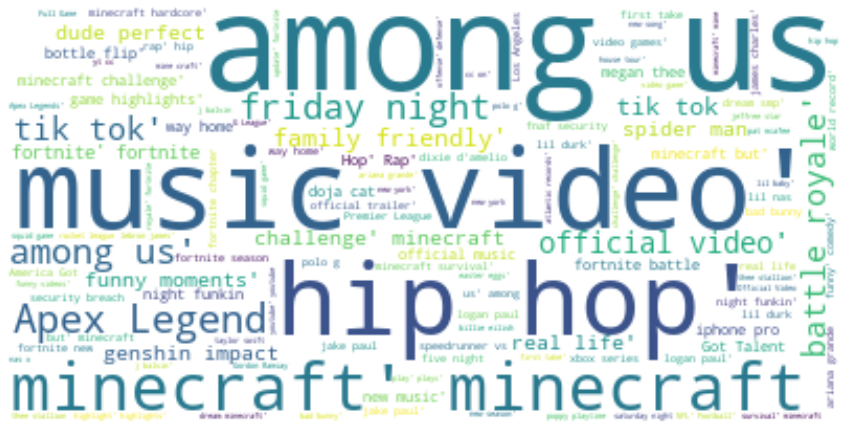

In [50]:
# create a text list of all words in column tags
text = " ".join(i for i in trending_copy.tags.astype(str))
# text = " ".join(i for i in data.text)

# set stopwords
stopwords = set(STOPWORDS)
stopwords.update(['None'])
# to update ex: stopwords.update(["bloom", "rose", "petals", "Average", "diameter","flushes", 'throughout', "Blooms", "form"])

# assign wordcloud
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig("wordcloud_tags.png")
plt.show()

### Correlation Matrix

In [51]:
# dropping title and channel_name as they are essentially row index
x_mx = trending.drop(columns = ['title', 'channel_name', 'year_trending', 'year_published',
                                 'month_trending', 'month_published', 'category', 'date_published', 'trending_date', 'tags','proportion_dislikes'])


In [52]:
# correlation matrix
corr_mx = x_mx.corr()

In [53]:
# melt corr_mx
corr_mx_long = corr_mx.reset_index().rename(
    columns = {'index': 'row'}
).melt(
    id_vars = 'row',
    var_name = 'col',
    value_name = 'Correlation'
)

# construct plot
alt.Chart(corr_mx_long).mark_rect().encode(
    x = alt.X('col', title = '', sort = {'field': 'Correlation', 'order': 'ascending'}), 
    y = alt.Y('row', title = '', sort = {'field': 'Correlation', 'order': 'ascending'}),
    color = alt.Color('Correlation', 
                      scale = alt.Scale(scheme = 'blueorange', # diverging gradient
                                        domain = (-1, 1), # ensure white = 0
                                        type = 'sqrt'), # adjust gradient scale
                     legend = alt.Legend(tickCount = 5)) # add ticks to colorbar at 0.5 for reference
).properties(width = 300, height = 300)


alt.Chart(...)

The correlation matrix tells us that there is a positive relationship between `likes`, `dislikes`, `views`, and `comment_counts`. This means that if one type of video interaction increases, so do others. For example, trending videos with more likes tend to also have a higher amount dislikes despite being the opposite sentiment. Furthermore, `likes` are slightly negatively correlated with `ratings_disabled` and `comments_disabled`. Therefore, the more positive interactions (likes) a video has, the less likely that the videos comments or ratings will be disabled by the channel. Another notable relationship is the positive correlation with `view_count` with `ratings_disabled` and `comments_disabled`. 

<a name="PCA"/>

### PCA

In [54]:
# center and scale ('normalize')
x_ctr = (x_mx - x_mx.mean())/x_mx.std()

In [55]:
# compute principal components
pca = PCA(n_components = x_ctr.shape[1]) 
pca.fit(x_ctr)

PCA(n_components=6)

In [56]:
# store proportion of variance explained as a dataframe
pca_var_explained = pd.DataFrame({'Proportion of variance explained': pca.explained_variance_ratio_})

# add component number as a new column
pca_var_explained['Component'] = np.arange(1, 7)

# add cumulative variance explained as a new column
pca_var_explained['Cumulative variance explained'] = np.cumsum(pca_var_explained['Proportion of variance explained'])

# print
print(pca_var_explained)

#The variance ratios drop off after 2 components. These first two capture about half of total variation in the data.

   Proportion of variance explained  Component  Cumulative variance explained
0                          0.494242          1                       0.494242
1                          0.195947          2                       0.690190
2                          0.137770          3                       0.827960
3                          0.087589          4                       0.915549
4                          0.065666          5                       0.981216
5                          0.018784          6                       1.000000


In [57]:
# store the loadings as a data frame with appropriate names
loading_df = pd.DataFrame(pca.components_).transpose().rename(
    columns = {0: 'PC1',1: 'PC2',2: 'PC3',3: 'PC4'} # add entries for each selected component
).loc[:, ['PC1', 'PC2','PC3','PC4']] # slice just components of interest

# add a column with the variable names
loading_df["Variable"] = x_ctr.columns
# print
loading_df

,PC1,PC2,PC3,PC4,Variable
0,0.520017,0.031440,0.008750,-0.377117,view_count
1,0.541746,-0.016913,0.010881,0.038725,likes
2,0.476787,0.022261,-0.048425,-0.420151,dislikes
3,0.456656,-0.006183,0.034219,0.822761,comment_count
4,-0.008513,0.707231,-0.704180,0.051403,comments_disabled
5,-0.012691,0.705702,0.707404,-0.013323,ratings_disabled


In [58]:
# melt from wide to long
loading_plot_df = loading_df.melt(
    id_vars = 'Variable',
    var_name = 'Principal Component',
    value_name = 'Loading'
)

# add a column of zeros to encode for x = 0 line to plot
loading_plot_df['zero'] = np.repeat(0, len(loading_plot_df))

# create base layer
base = alt.Chart(loading_plot_df)

# create lines + points for loadings
loadings = base.mark_line(point = True).encode(
    y = alt.X('Variable', title = ''),
    x = 'Loading',
    color = 'Principal Component'
)

# create line at zero
rule = base.mark_rule().encode(x = alt.X('zero', title = 'Loading'), size = alt.value(0.05))

# layer
loading_plot = (loadings + rule).properties(width = 200,height = 400)

# show
loading_plot = loading_plot.facet(column = 'Principal Component')
loading_plot

alt.FacetChart(...)

Lets take a look at which variables influence each principal component.

PC1:  `comment_count`, `view_count`, `dislikes` and `likes`  have the largest positive loading values. Therefore, increasing these values increase the level of PC1. This is consistent with the correlation matrix we constructed earlier. We can conclude that PC1 represents counts of video interactions. 

PC2: High values are coming from videos with comments or ratings disabled. This may describe the positive relationship between videos with interactions disabled.

PC3: Negative Disabled interaction. High values of `comments_disabled` lower the values of this PC while high values of `ratings_disabled` raises it. This is interesting compared to what we see in PC2. In the correlation matrix we observed that these two variables are positively correlated.

PC4: `comment_count` has a high positive loading. `Dislikes` and `view_count` have a low value.. This PC may also represent a different relationship between video interactions.

### Exploratory analysis based on PCA

In [59]:
# principal component values
pca.fit_transform(x_ctr)

array([[ 0.16656077, -0.14805165,  0.02381799,  0.16007153,  0.32103531,
        -0.07799367],
       [ 0.00192235, -0.14804524,  0.02960695,  0.04525148,  0.04103722,
        -0.01236675],
       [ 0.36080775, -0.15994534,  0.04432409,  0.30666601, -0.10061895,
        -0.3336396 ],
       ...,
       [-0.28225591, -0.15288974,  0.03467391,  0.08240435, -0.05457941,
         0.03293652],
       [-0.313157  , -0.14988956,  0.03284869,  0.02406142, -0.05803745,
         0.10158205],
       [-0.46350244, -0.15539   ,  0.03003254,  0.09650814,  0.06402964,
         0.01707174]])

In [60]:
# project data onto first four components; store as data frame
projected_data = pd.DataFrame(pca.fit_transform(x_ctr)).iloc[:, 0:4].rename(columns = {0: 'PC1', 1: 'PC2', 2: 'PC3', 3: 'PC4'})

# add state and county
projected_data[['title', 'channel_name']] = trending[['title', 'channel_name']]

# print
projected_data.head(4)

,PC1,PC2,PC3,PC4,title,channel_name
0,0.166561,-0.148052,0.023818,0.160072,I ASKED HER TO BE MY GIRLFRIEND...,Brawadis
1,0.001922,-0.148045,0.029607,0.045251,Apex Legends | Stories from the Outlands – “Th...,Apex Legends
2,0.360808,-0.159945,0.044324,0.306666,I left youtube for a month and THIS is what ha...,jacksepticeye
3,-0.380841,-0.152563,0.024342,0.085391,XXL 2020 Freshman Class Revealed - Official An...,XXL


In [61]:
# take a random sample for visualization
projected_data_sample = projected_data.sample(n = 5000)

In [62]:
# base chart
base = alt.Chart(projected_data_sample)

# data scatter
scatter = base.mark_point(opacity = 0.2).encode(
    x = alt.X('PC1:Q', title = 'PC1'),
    y = alt.Y('PC2:Q', title = 'PC2')
)

# show
scatter

alt.Chart(...)

To better undestand the relationship between video interaction variables (likes, dislikes, comment counts, and views) and disabled interactions, we are comparing PC1 vs PC2. However, there seems to be a lot of outliers in the data that are difficult to explain.

<a name="MLR"/>

## Multiple Linear Regression

In [9]:
trending_shuffle = trending.sample(frac = 1)
x_df = trending_shuffle.drop(columns = ['title', 'channel_name','comments_disabled', 'ratings_disabled', 'year_trending', 'year_published',
                                 'month_trending', 'month_published', 'category', 'date_published', 'trending_date', 'tags','proportion_dislikes',  'view_count'])


genres = pd.get_dummies(trending_shuffle.category)

#x_df = pd.concat([x_df, genres], axis = 1)
x_mx = add_dummy_feature(x_df,value = 1)
y = trending_shuffle['view_count']



In [10]:
mlr = LinearRegression(fit_intercept = False)

# fit model
mlr.fit(x_mx, y)

LinearRegression(fit_intercept=False)

In [11]:
# store dimensions
n, p = x_mx.shape

# compute x'x
xtx = x_mx.transpose().dot(x_mx)

# compute x'x inverse
xtx_inv = np.linalg.inv(xtx)

# compute residuals
fitted_mlr = mlr.predict(x_mx)
resid = y - fitted_mlr

# compute error variance estimate
sigmasqhat = ((n - 1)/(n - p)) * resid.var()

# compute variance-covariance matrix

v_hat = xtx_inv * sigmasqhat

# compute standard errors

coef_se = np.sqrt(v_hat.diagonal())

coef_se = np.append(coef_se,[float('nan')])

# coefficient labels
coef_labels = np.array(x_df.columns)

coef_labels = np.append(coef_labels, ['intercept', 'error_variance'])

# estimates
coef_estimates = np.append(mlr.coef_, sigmasqhat)

# summary table
coef_table = pd.DataFrame(
    data = {'coefficient estimate': coef_estimates, 'standard error': coef_se},
    index = coef_labels
)

# print
coef_table

,coefficient estimate,standard error
likes,4.760420e+05,10789.333944
dislikes,1.357339e+01,0.037714
comment_count,1.437878e+02,1.083000
intercept,-1.305102e+01,0.157872
error_variance,1.149282e+13,NaN


In [12]:
r2_score(y, fitted_mlr)

0.766859224932396